<a href="https://colab.research.google.com/github/Aniketnegi03/signal-classification-using-CNN/blob/main/1signal_classification_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import random
import os
import datetime
from tqdm import tqdm

import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Dense, Flatten, MaxPooling2D, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping, CSVLogger, ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Loading datasets

In [2]:
import os
os.chdir('/content')
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
ls

drive/  sample_data/


#### Reading Paths and classes_names

In [ ]:

dir="./drive/MyDrive/signal_cnn"

train_path = "./drive/MyDrive/signal_cnn/primary_small/train"
val_path = "./drive/MyDrive/signal_cnn/primary_small/valid"

classes_list = os.listdir("./drive/MyDrive/signal_cnn/primary_small/train")
classes_list

['brightpixel',
 'narrowband',
 'narrowbanddrd',
 'noise',
 'squarepulsednarrowband',
 'squiggle',
 'squigglesquarepulsednarrowband']

In [ ]:
classes_list = sorted(os.listdir("./drive/MyDrive/signal_cnn/primary_small/train"))
classes_list

['brightpixel',
 'narrowband',
 'narrowbanddrd',
 'noise',
 'squarepulsednarrowband',
 'squiggle',
 'squigglesquarepulsednarrowband']

## Loading training datset 

In [ ]:
batch_size= 128
train_ds = image_dataset_from_directory(
    train_path,
    batch_size = batch_size)

Found 5600 files belonging to 7 classes.


## Visualizing the training dataset

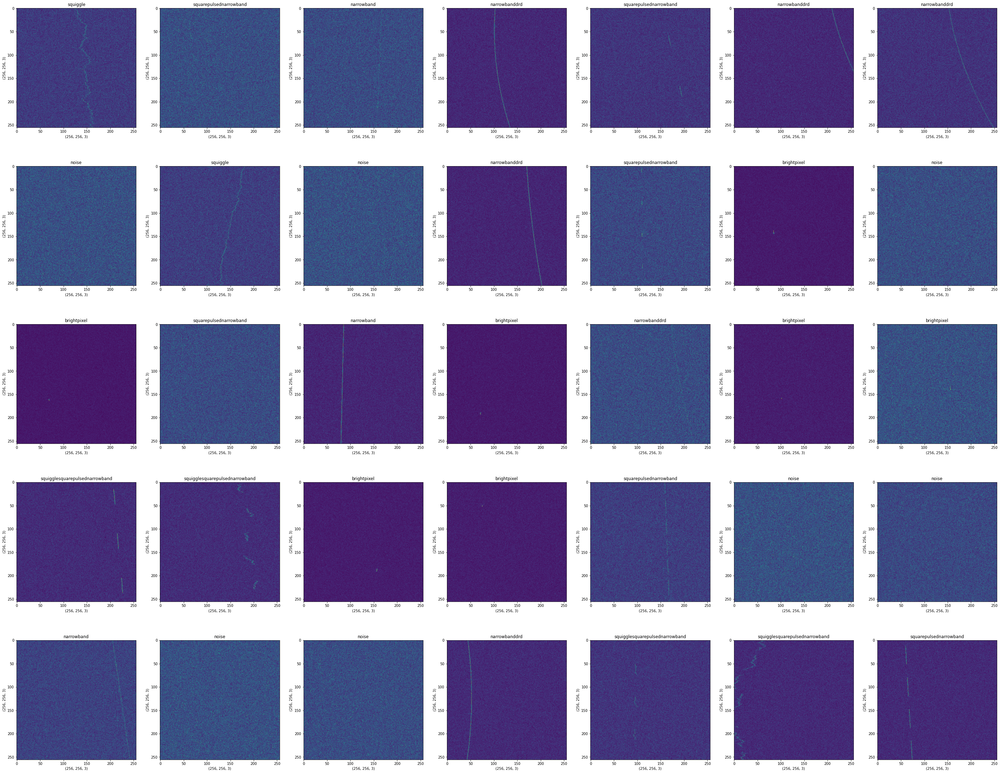

In [ ]:
plt.figure(figsize=(50, 40))
for images, labels in train_ds.take(1):
    for i in range(1, 36):
        plt.subplot(5, 7, i)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(classes_list[labels[i]])
        plt.xlabel(images[i].numpy().astype("uint8").shape)
        plt.ylabel(images[i].numpy().astype("uint8").shape)
        # plt.axis('off')

## Loading validation dataset

In [ ]:
val_ds = image_dataset_from_directory(
    val_path, 
    batch_size=batch_size)

Found 700 files belonging to 7 classes.


### verifying the shape of the batches in training dataset

In [ ]:
for img_batch, label_batch in train_ds.take(1):
    print('image batch shape: ', img_batch.shape)
    print('label_batch shape: ', label_batch.shape)

image batch shape:  (128, 256, 256, 3)
label_batch shape:  (128,)


### verifying the shape of the batches in validation dataset

In [ ]:
for img_batch, label_batch in val_ds.take(1):
    print('image batch shape: ', img_batch.shape)
    print('label_batch shape: ', label_batch.shape)

image batch shape:  (128, 256, 256, 3)
label_batch shape:  (128,)


# Normalizing and Resizing the images

In [ ]:
img_width = 256
img_height = 256

resizing_layer = tf.keras.layers.experimental.preprocessing.Resizing(img_width, img_height)
normalizing_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)

In [ ]:
train_ds = train_ds.map(lambda x, y: (resizing_layer(x), y))
train_ds = train_ds.map(lambda x, y: (normalizing_layer(x), y))

In [ ]:
val_ds = val_ds.map(lambda x, y: (resizing_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalizing_layer(x), y))

****Train dataset****

In [ ]:
img_batch, label_batch = next(iter(train_ds))
img = img_batch[0]
label = label_batch[0]

print(np.min(img), ' --> ', np.max(img))
print('shape: ', img.shape)
print('label: ', label)

0.07058824  -->  0.7436275
shape:  (256, 256, 3)
label:  tf.Tensor(0, shape=(), dtype=int32)


****validation dataset****

In [ ]:
img_batch, label_batch = next(iter(val_ds))
img = img_batch[0]
label = label_batch[0]

print(np.min(img), ' --> ', np.max(img))
print('shape: ', img.shape)
print('label: ', label)

same all images now range from 0 to 1

# Creating the Model

In [ ]:
num_classes = len(classes_list)

inputs = Input(shape=(img_width, img_height, 3))

x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
x = MaxPooling2D(pool_size=(5, 5))(x)
x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(5, 5))(x)
x = Dropout(0.15)(x)

x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.15)(x)

x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.15)(x)

x = Flatten()(x)

x = Dense(1024, activation='relu')(x)
x = Dropout(0.4)(x)

classifier = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=classifier)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs = 30
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
model.fit(train_ds,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=val_ds,
          callbacks=[EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True),
                     CSVLogger("train.csv")])

Epoch 1/30
44/44 [==============================] - 450s 10s/step - loss: 1.8993 - accuracy: 0.1832 - val_loss: 1.7810 - val_accuracy: 0.2257
Epoch 2/30
44/44 [==============================] - 74s 2s/step - loss: 1.7797 - accuracy: 0.2505 - val_loss: 1.7423 - val_accuracy: 0.2786
Epoch 3/30
44/44 [==============================] - 72s 1s/step - loss: 1.7236 - accuracy: 0.2850 - val_loss: 1.7923 - val_accuracy: 0.2414
Epoch 4/30
44/44 [==============================] - 70s 1s/step - loss: 1.7683 - accuracy: 0.2605 - val_loss: 1.8135 - val_accuracy: 0.2271
Epoch 5/30
44/44 [==============================] - 62s 1s/step - loss: 1.7283 - accuracy: 0.2870 - val_loss: 1.6830 - val_accuracy: 0.3071
Epoch 6/30
44/44 [==============================] - 65s 1s/step - loss: 1.6730 - accuracy: 0.3045 - val_loss: 1.6889 - val_accuracy: 0.3100
Epoch 7/30
44/44 [==============================] - 60s 1s/step - loss: 1.7763 - accuracy: 0.2620 - val_loss: 1.7222 - val_accuracy: 0.2814
Epoch 8/30
44/44 [

In [ ]:
cp train.csv -d './drive/MyDrive/signal_cnn'

# Save model architecture and weights

In [ ]:
model.save("./drive/MyDrive/signal_cnn/radio_signals_classifier.h5")
model.save_weights("./drive/MyDrive/signal_cnn/radio_signals.weights.h5")

# plot the model accuracy and loss

In [ ]:
def plot_accuray(history):
    plt.figure(figsize=(12, 8))
    plt.title("Image Model Accuracy")
    plt.plot(history.history['accuracy'], color='g')
    plt.plot(history.history['val_accuracy'], color='b')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend(['train', 'val'], loc="lower right")
    plt.show()

In [ ]:
def plot_loss(history):
    plt.figure(figsize=(12, 8))
    plt.title("Image Model Loss")
    plt.plot(history.history['loss'], color='g')
    plt.plot(history.history['val_loss'], color='b')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend(['train', 'val'], loc="lower right")
    plt.show()

****instantiating model history****

In [ ]:
history = model.history

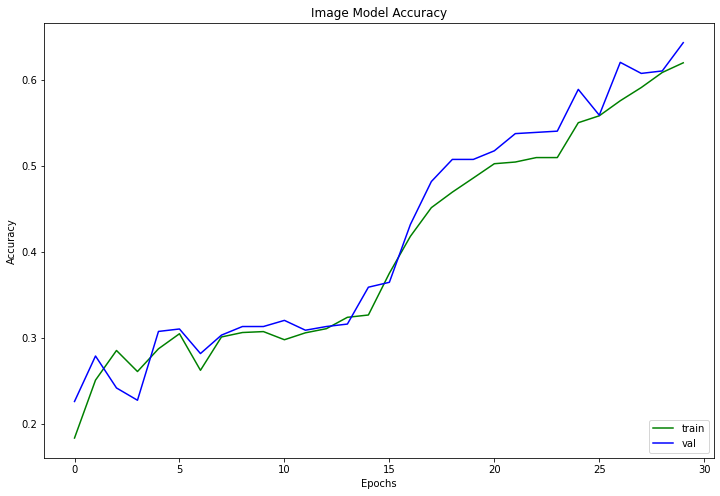

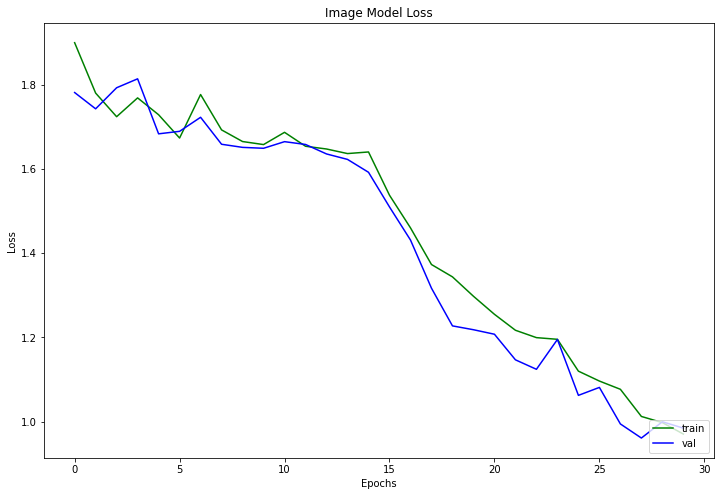

In [ ]:
plot_accuray(history)
plot_loss(history)

# Loading test dataset

In [ ]:
test_path = "./drive/MyDrive/signal_cnn/primary_small/test"
test_classes = sorted(os.listdir(test_path))
test_classes

['brightpixel',
 'narrowband',
 'narrowbanddrd',
 'noise',
 'squarepulsednarrowband',
 'squiggle',
 'squigglesquarepulsednarrowband']

In [ ]:
test_dataset = image_dataset_from_directory(
  test_path,
  batch_size = batch_size,  
  image_size=(img_height, img_width))

Found 700 files belonging to 7 classes.


In [ ]:
test_dataset = test_dataset.map(lambda x, y: (normalizing_layer(x), y))

# Evaluating Model

In [ ]:
loss, acc = model.evaluate(test_dataset)

6/6 [==============================] - 6s 196ms/step - loss: 0.9826 - accuracy: 0.6357


In [ ]:
loss

0.9825984239578247

In [ ]:
acc = acc * 100

In [ ]:
print('{:.2f}%'.format(acc))

63.57%
